In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Initial data handling

Identify the disease_status of each individual reads and join them into individual datasets

In [2]:
sample_info = pd.read_csv("sample_info.txt", sep="\t", header=None, names=["Sample_id", "Type", "Read_1", "Read_2"])
sample_id = pd.Series(sample_info["Sample_id"])

In [2]:
# Identifying the number if sequences in each datasets
sequence_num_info = pd.DataFrame(columns=["Sample_id", "Sequence_number"])

airr_path = "/home/s2106664/presto_igblast_analysis/airr_reads"

"""
# Loop through each sample and read the corresponding AIRR file to count sequences
for sample in sample_id:
    sequence_read = pd.read_csv(f"{airr_path}/{sample}.airr.tsv", sep="\t")
    sequence_num = sequence_read.shape[0]
    sequence_num_info.loc[len(sequence_num_info)] = [sample, sequence_num]

#Export the sequence number information to a file
sequence_num_info.to_csv("sequence_num_info.csv", sep="\t", index=False)
"""

'\n# Loop through each sample and read the corresponding AIRR file to count sequences\nfor sample in sample_id:\n    sequence_read = pd.read_csv(f"{airr_path}/{sample}.airr.tsv", sep="\t")\n    sequence_num = sequence_read.shape[0]\n    sequence_num_info.loc[len(sequence_num_info)] = [sample, sequence_num]\n\n#Export the sequence number information to a file\nsequence_num_info.to_csv("sequence_num_info.csv", sep="\t", index=False)\n'

Create new datasets to join the control and diseased (RA) seqeunces

In [3]:
# Extract the sample ID that belongs to the control group
control_sample_id = sample_id[sample_id.str.startswith(("B", "C"))].to_list()
control_sample_id

['C0017',
 'C0018',
 'C0019',
 'B1392',
 'B1640',
 'B1168',
 'C0020',
 'C0021',
 'C0022',
 'B3179',
 'B8181',
 'B8630',
 'B6844',
 'B1413',
 'B1639',
 'B4077']

In [26]:
# Join the control seqeunces into single datasets
control_data = pd.DataFrame()

for sample in control_sample_id:
    data = pd.read_csv(f"{airr_path}/{sample}.airr.tsv", sep="\t")
    control_data = pd.concat([control_data, data], ignore_index=True)

# Annotate the datatset (disease_status = 0 for control)
control_data["disease_status"] = 0

# Save the control data to a CSV file
control_data.to_csv("control_data.airr.csv", index=False)

In [9]:
# Extract the sample ID that belongs to the RA group
ra_sample_id = sample_id[sample_id.str.startswith("A")].to_list()
ra_sample_id

['A0001',
 'A0005',
 'A0006',
 'A0011',
 'A0016',
 'A0015',
 'A0013',
 'A0014',
 'A0012',
 'A0004',
 'A0003',
 'A0007',
 'A0010',
 'A0025']

In [27]:
# Join the RA seqeunces into single datasets
ra_data = pd.DataFrame()

for sample in ra_sample_id:
    data = pd.read_csv(f"{airr_path}/{sample}.airr.tsv", sep="\t")
    ra_data = pd.concat([ra_data, data], ignore_index=True)

# Annotate the datatset (disease_status = 1 for ra)
ra_data["disease_status"] = 1

# Save the RA data to a CSV file
ra_data.to_csv("RA_data.airr.csv", index=False)

# Filtering of the control data

In [3]:
control_data = pd.read_csv("control_data.airr.csv")

In [4]:
control_data.shape

(5508324, 97)

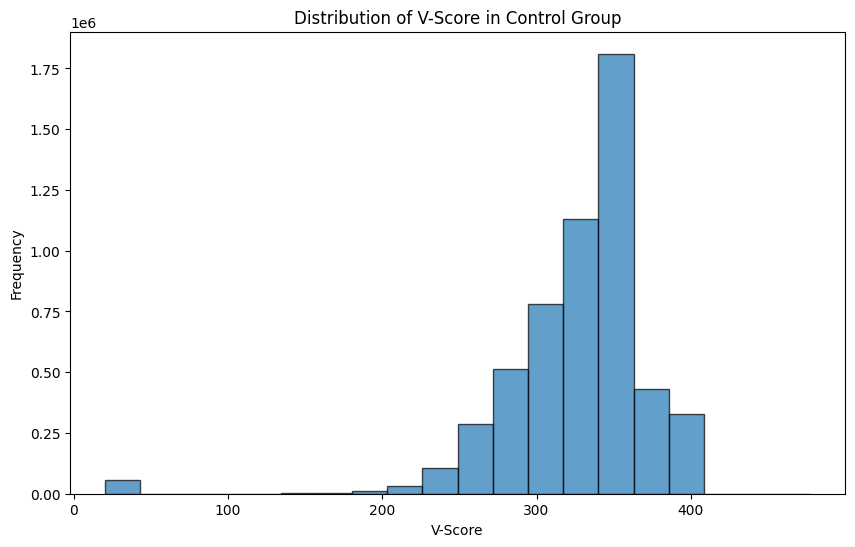

In [5]:
# identification of the v-score distribution in the control group
control_vscore = control_data["v_score"]

plt.figure(figsize=(10, 6))
plt.hist(control_vscore, bins=20, alpha=0.7, edgecolor='black')
plt.title("Distribution of V-Score in Control Group")
plt.xlabel("V-Score")
plt.ylabel("Frequency")
plt.show()

In [6]:
# Filter data based on v_score
control_data_filter = control_data[control_data["v_score"] > 200]
print(control_data_filter.shape)
print(f'The shape of the data after filtering v_call NAs: {control_data_filter["v_call"].dropna().shape}')
print(f'The shape of the data after filtering d_call NAs: {control_data_filter["d_call"].dropna().shape}')
print(f'The shape of the data after filtering j_call NAs: {control_data_filter["j_call"].dropna().shape}')

(5417028, 97)
The shape of the data after filtering v_call NAs: (5417028,)
The shape of the data after filtering d_call NAs: (5272956,)
The shape of the data after filtering j_call NAs: (5412680,)


In [7]:
# Filter data based on j_call NAs
control_data_filter = control_data_filter[control_data_filter["j_call"].notna()]
print(f'The shape of the data after filtering j_call NAs: {control_data_filter["j_call"].dropna().shape}')

The shape of the data after filtering j_call NAs: (5412680,)


In [8]:
control_data_filter["d_call"].isna().sum()

np.int64(143468)

In [9]:
control_data_filter[["v_sequence_alignment", "v_germline_alignment"]]

,v_sequence_alignment,v_germline_alignment
0,AGGCACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCT...,AGGCACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCT...
1,CACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCTGGA...,CACCTTCACCAGCTACTATATGCACTGGGTGCGACAGGCCCCTGGA...
2,TGCAGCCTCTGGATTCACCTTTAGTAGCTATTGGATGAGCTGGGTC...,TGCAGCCTCTGGATTCACCTTTAGTAGCTATTGGATGAGCTGGGTC...
3,TGCAGCCTCTGGATTCACCTTTAGCAGCTATGCCATGAGCTGGGTC...,TGCAGCCTCTGGATTCACCTTTAGCAGCTATGCCATGAGCTGGGTC...
4,TAAGGGATCTGGATACAGCTTTACCAGCTACTGGATCAGCTGGGTG...,TAAGGGTTCTGGATACAGCTTTACCAGCTACTGGATCAGCTGGGTG...
...,...,...
5508127,GGCCTCAGTGCAGGTGTCCTGCAAGGCTTCCGAATACACCTTCACT...,GGCCTCAGTGAAGGTTTCCTGCAAGGCTTCTGGATACACCTTCACT...
5508131,CTTTAGCACTTTTGCTCTCTGCTGGGTGCGGCAGGCCCCTGGACGA...,CTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCTGGACAA...
5508132,CTTTAGCACTTTTGCTCTCTGCTGGGTGCGGCAGGCCCCTGGACGA...,CTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCTGGACAA...
5508170,GGGGCCTCAGTGAAGGTCTCCTGCAACGTTTCCGGACACACCCTCA...,GGGGCCTCAGTGAAGGTCTCCTGCAAGGTTTCCGGATACACCCTCA...


# Filtering of the RA data

In [10]:
ra_data = pd.read_csv("RA_data.airr.csv")

In [11]:
ra_data.shape

(4554622, 97)

In [12]:
ra_data_filter = ra_data[ra_data["v_score"] > 100]
print(ra_data_filter.shape)
print(f'The shape of the data after filtering v_call NAs: {ra_data_filter["v_call"].dropna().shape}')
print(f'The shape of the data after filtering d_call NAs: {ra_data_filter["d_call"].dropna().shape}')
print(f'The shape of the data after filtering j_call NAs: {ra_data_filter["j_call"].dropna().shape}')

(4500231, 97)
The shape of the data after filtering v_call NAs: (4500231,)
The shape of the data after filtering d_call NAs: (4387290,)
The shape of the data after filtering j_call NAs: (4495414,)


In [13]:
# Filter data based on j_call NAs
ra_data_filter = ra_data_filter[ra_data_filter["j_call"].notna()]
print(f'The shape of the data after filtering j_call NAs: {ra_data_filter["j_call"].dropna().shape}')

The shape of the data after filtering j_call NAs: (4495414,)


# Creation of final datasets
Join the datasets into single column and export as single data table

In [14]:
# Identify the shape of each dataset
print(control_data_filter.shape)
print(ra_data_filter.shape)

(5412680, 97)
(4495414, 97)


In [29]:
final_data = pd.concat([control_data_filter, ra_data_filter], ignore_index=True)

final_data = final_data[["sequence_id", "v_sequence_alignment", "v_germline_alignment", "np1_length", "np2_length",
                         "cdr3_start", "cdr3_end", "junction_aa", "v_call", "j_call", "disease_status"]]

# Save the final combined dataset to a CSV file
final_data.to_csv("airr_filtered.csv", index=False)

# Display the shape of the final combined dataset
print(final_data.shape)

(9908094, 11)


In [2]:
feature_data = pd.read_csv("airr_filtered.csv")

feature_data

,sequence_id,v_sequence_alignment,v_germline_alignment,np1_length,np2_length,cdr3_start,cdr3_end,junction_aa,v_call,j_call,disease_status
0,M00689:14:000000000-A2E6E:1:1101:14934:2065|CP...,AGGCACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCT...,AGGCACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCT...,16.0,13.0,212.0,286.0,CARRVLPPDYDFWSGYYRGHGDWFDPW,"IGHV1-69*01,IGHV1-69*12,IGHV1-69*13",IGHJ5*02,0
1,M00689:14:000000000-A2E6E:1:1101:18849:3537|CP...,CACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCTGGA...,CACCTTCACCAGCTACTATATGCACTGGGTGCGACAGGCCCCTGGA...,6.0,8.0,212.0,286.0,CARDLTYYYDSSGYFPTYYYYYGMDVW,IGHV1-46*01,IGHJ6*02,0
2,M00689:14:000000000-A2E6E:1:1101:10681:3763|CP...,TGCAGCCTCTGGATTCACCTTTAGTAGCTATTGGATGAGCTGGGTC...,TGCAGCCTCTGGATTCACCTTTAGTAGCTATTGGATGAGCTGGGTC...,16.0,0.0,224.0,286.0,CARDEALRSIAVAGTYYYGMDVW,IGHV3-7*05,IGHJ6*02,0
3,M00689:14:000000000-A2E6E:1:1101:21840:3357|CP...,TGCAGCCTCTGGATTCACCTTTAGCAGCTATGCCATGAGCTGGGTC...,TGCAGCCTCTGGATTCACCTTTAGCAGCTATGCCATGAGCTGGGTC...,8.0,5.0,224.0,286.0,CAKDDSPAAGTPYYYYYYGMDVW,"IGHV3-23*01,IGHV3-23*04",IGHJ6*02,0
4,M00689:14:000000000-A2E6E:1:1101:10092:3445|CP...,TAAGGGATCTGGATACAGCTTTACCAGCTACTGGATCAGCTGGGTG...,TAAGGGTTCTGGATACAGCTTTACCAGCTACTGGATCAGCTGGGTG...,22.0,6.0,224.0,283.0,CARLPMGKGTRSSSSLIWFDPW,"IGHV5-10-1*01,IGHV5-10-1*03",IGHJ5*02,0
...,...,...,...,...,...,...,...,...,...,...,...
9908089,M00689:37:000000000-A3EUR:1:2102:24137:13788|C...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAGTGGGTGTGGG...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAGTGGGTGTGGG...,25.0,40.0,228.0,341.0,CAHRSSVKGGVYMWW*LLWPRGGHDHQEGGGYYYYIMDVW,IGHV2-5*01,IGHJ6*02,1
9908090,M00689:37:000000000-A3EUR:1:2104:14937:18059|C...,CACCTTCTCTGGGTTCTCACTCACCACTAGTGGAGTGGGTGTGGGC...,CACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAGTGGGTGTGGGC...,25.0,40.0,228.0,341.0,CAHRSSVKGGVYMWW*LLWPRGGHDHQEGGGYYYYIMDVW,IGHV2-5*01,IGHJ6*02,1
9908091,M00689:37:000000000-A3EUR:1:2114:13266:24350|C...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAATGTGTGTGAG...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAATGTGTGTGAG...,76.0,13.0,228.0,341.0,LWKQ*LAALQKPCSPGTPGCGFL*PLAQG*LTVAEYFQHW,IGHV2-70*01,IGHJ1*01,1
9908092,M00689:37:000000000-A3EUR:1:2110:8019:9527|CPR...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAATGTGTGTGAG...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAATGTGTGTGAG...,76.0,13.0,228.0,341.0,LWKQ*LAALQKPCSPGTPGCGFL*PLAQG*LTVAEYFQHW,IGHV2-70*01,IGHJ1*01,1


## Feature 1. Somatic hypermutation rate

In [3]:
hypermutation_rate = []

for sequence, germline in zip(feature_data["v_sequence_alignment"], feature_data["v_germline_alignment"]):
    match_counter = 0
    mismatch_counter = 0
    for num in range(len(sequence)):
        if sequence[num] == germline[num]:
            match_counter += 1
        else:
            mismatch_counter += 1
    hypermutation = mismatch_counter / (mismatch_counter + match_counter)
    hypermutation_rate.append(hypermutation)

feature_data["hypermutation_rate"] = hypermutation_rate

In [24]:
hyper_c = feature_data[feature_data["disease_status"] == 0]["hypermutation_rate"]
hyper_ra = feature_data[feature_data["disease_status"] == 1]["hypermutation_rate"]

In [25]:
hyper_c

0          0.000000
1          0.050926
2          0.000000
3          0.004329
4          0.052174
             ...   
5412675    0.071429
5412676    0.075472
5412677    0.070755
5412678    0.138340
5412679    0.011952
Name: hypermutation_rate, Length: 5412680, dtype: float64

## Feature 2. CDR3 length

In [4]:
feature_data["cdr3_length"] = feature_data["cdr3_end"] - feature_data["cdr3_start"] + 1

feature_data

,sequence_id,v_sequence_alignment,v_germline_alignment,np1_length,np2_length,cdr3_start,cdr3_end,junction_aa,v_call,j_call,disease_status,hypermutation_rate,cdr3_length
0,M00689:14:000000000-A2E6E:1:1101:14934:2065|CP...,AGGCACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCT...,AGGCACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCT...,16.0,13.0,212.0,286.0,CARRVLPPDYDFWSGYYRGHGDWFDPW,"IGHV1-69*01,IGHV1-69*12,IGHV1-69*13",IGHJ5*02,0,0.000000,75.0
1,M00689:14:000000000-A2E6E:1:1101:18849:3537|CP...,CACCTTCAGCAGCTATGCTATCAGCTGGGTGCGACAGGCCCCTGGA...,CACCTTCACCAGCTACTATATGCACTGGGTGCGACAGGCCCCTGGA...,6.0,8.0,212.0,286.0,CARDLTYYYDSSGYFPTYYYYYGMDVW,IGHV1-46*01,IGHJ6*02,0,0.050926,75.0
2,M00689:14:000000000-A2E6E:1:1101:10681:3763|CP...,TGCAGCCTCTGGATTCACCTTTAGTAGCTATTGGATGAGCTGGGTC...,TGCAGCCTCTGGATTCACCTTTAGTAGCTATTGGATGAGCTGGGTC...,16.0,0.0,224.0,286.0,CARDEALRSIAVAGTYYYGMDVW,IGHV3-7*05,IGHJ6*02,0,0.000000,63.0
3,M00689:14:000000000-A2E6E:1:1101:21840:3357|CP...,TGCAGCCTCTGGATTCACCTTTAGCAGCTATGCCATGAGCTGGGTC...,TGCAGCCTCTGGATTCACCTTTAGCAGCTATGCCATGAGCTGGGTC...,8.0,5.0,224.0,286.0,CAKDDSPAAGTPYYYYYYGMDVW,"IGHV3-23*01,IGHV3-23*04",IGHJ6*02,0,0.004329,63.0
4,M00689:14:000000000-A2E6E:1:1101:10092:3445|CP...,TAAGGGATCTGGATACAGCTTTACCAGCTACTGGATCAGCTGGGTG...,TAAGGGTTCTGGATACAGCTTTACCAGCTACTGGATCAGCTGGGTG...,22.0,6.0,224.0,283.0,CARLPMGKGTRSSSSLIWFDPW,"IGHV5-10-1*01,IGHV5-10-1*03",IGHJ5*02,0,0.052174,60.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9908089,M00689:37:000000000-A3EUR:1:2102:24137:13788|C...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAGTGGGTGTGGG...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAGTGGGTGTGGG...,25.0,40.0,228.0,341.0,CAHRSSVKGGVYMWW*LLWPRGGHDHQEGGGYYYYIMDVW,IGHV2-5*01,IGHJ6*02,1,0.004237,114.0
9908090,M00689:37:000000000-A3EUR:1:2104:14937:18059|C...,CACCTTCTCTGGGTTCTCACTCACCACTAGTGGAGTGGGTGTGGGC...,CACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAGTGGGTGTGGGC...,25.0,40.0,228.0,341.0,CAHRSSVKGGVYMWW*LLWPRGGHDHQEGGGYYYYIMDVW,IGHV2-5*01,IGHJ6*02,1,0.021277,114.0
9908091,M00689:37:000000000-A3EUR:1:2114:13266:24350|C...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAATGTGTGTGAG...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAATGTGTGTGAG...,76.0,13.0,228.0,341.0,LWKQ*LAALQKPCSPGTPGCGFL*PLAQG*LTVAEYFQHW,IGHV2-70*01,IGHJ1*01,1,0.000000,114.0
9908092,M00689:37:000000000-A3EUR:1:2110:8019:9527|CPR...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAATGTGTGTGAG...,GCACCTTCTCTGGGTTCTCACTCAGCACTAGTGGAATGTGTGTGAG...,76.0,13.0,228.0,341.0,LWKQ*LAALQKPCSPGTPGCGFL*PLAQG*LTVAEYFQHW,IGHV2-70*01,IGHJ1*01,1,0.004464,114.0


## Feature 3. Junction amino acid using Atchley factors

In [9]:
atchley_table = pd.read_csv("atchley_factors.csv")
atchley_table

,Amino_acid,Factor_I,Factor_II,Factor_III,Factor_IV,Factor_V
0,A,-0.591,-1.302,-0.733,1.570,-0.146
1,C,-1.343,0.465,-0.862,-1.020,-0.255
2,D,1.050,0.302,-3.656,-0.259,-3.242
3,E,1.357,-1.453,1.477,0.113,-0.837
4,F,-1.006,-0.590,1.891,-0.397,0.412
5,G,-0.384,1.652,1.330,1.045,2.064
6,H,0.336,-0.417,-1.673,-1.474,-0.078
7,I,-1.239,-0.547,2.131,0.393,0.816
8,K,1.831,-0.561,0.533,-0.277,1.648
9,L,-1.019,-0.987,-1.505,1.266,-0.912


In [15]:
# Create atchley dictionary for quicker lookup
atchley_dict = atchley_table.set_index("Amino_acid").iloc[:, 0:].T.to_dict("list")

In [ ]:
for sequence in feature_data["junction_aa"]:
    if 

'CARDEALRSIAVAGTYYYGMDVW'

In [ ]:
feature_data = feature_data.dropna(subset=["junction_aa"])
feature_dat = feature_data[""]
feature_data.shape

(9887439, 13)

In [17]:
atchley_features_list = []
counter = 0

for sequence in feature_data["junction_aa"]:
    sequence_factors = []
    for amino_acid in sequence:
        if amino_acid in atchley_dict:
            sequence_factors.append(atchley_dict[amino_acid])
        elif amino_acid == "X":
            print(f"Skipping unknown amino acid 'X' in sequence {sequence}.")
        else:
            print(f"Amino acid {amino_acid} not found in Atchley table.")
            counter += 1
    if sequence_factors:
        # Convert to DataFrame or NumPy array, then compute mean
        mean_factors = pd.DataFrame(sequence_factors, columns=atchley_table.columns[1:]).mean()
        atchley_features_list.append(mean_factors)

# Combine all results into a DataFrame
atchley_features = pd.DataFrame(atchley_features_list)

Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not found in Atchley table.
Amino acid * not

KeyboardInterrupt: 

## Feature 4. NP1 and NP2 length

In [ ]:
feature_data[["np1_length", "np2_length"]]

## Feature 5. V and J segemnt usage